# Satellite Image Analysis using numpy

## Loading the libraries we need

In [1]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

## Crating a numpy array from an image file

In [2]:
# Base image
from skimage import data
photo_data = misc.imread("./wifire/sd-3layers.jpg")
type (photo_data)

/usr/lib/python3/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


numpy.ndarray

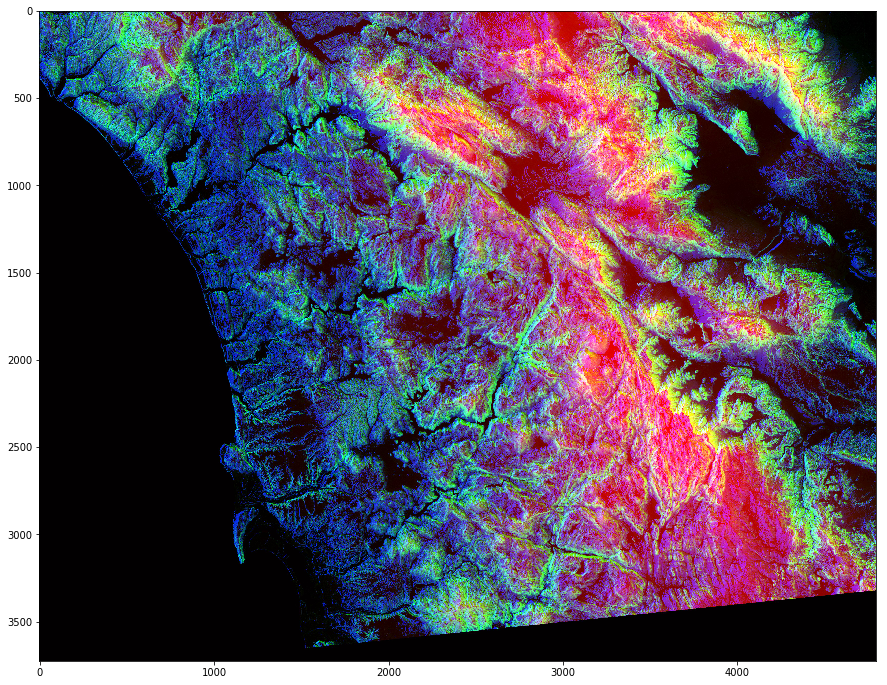

In [3]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [4]:
photo_data.shape 

(3725, 4797, 3)

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are lengt and with, and the third number is for the layers: Red, Green and Blue
- **Red** pixel indicates **Altitude**
- **Blue** pixel indicates **Aspect**
- **Green** pixel indicates **Slope**

The higher values denotate higher altitude, aspect and slope

In [5]:
photo_data.size

53606475

In [6]:
# Maximum and minimum of the data values
photo_data.min(), photo_data.max()

(0, 255)

This values are important to verivy since the eight bit color intensity cant be outside 0 or 255 range

In [7]:
photo_data.mean()

75.8299354508947

In [8]:
# Pixel of the 150th row and 250th column
photo_data[150,250]

array([ 17,  35, 255], dtype=uint8)

In [9]:
photo_data[150,250,1]

35

## Set a pixel to all zeros

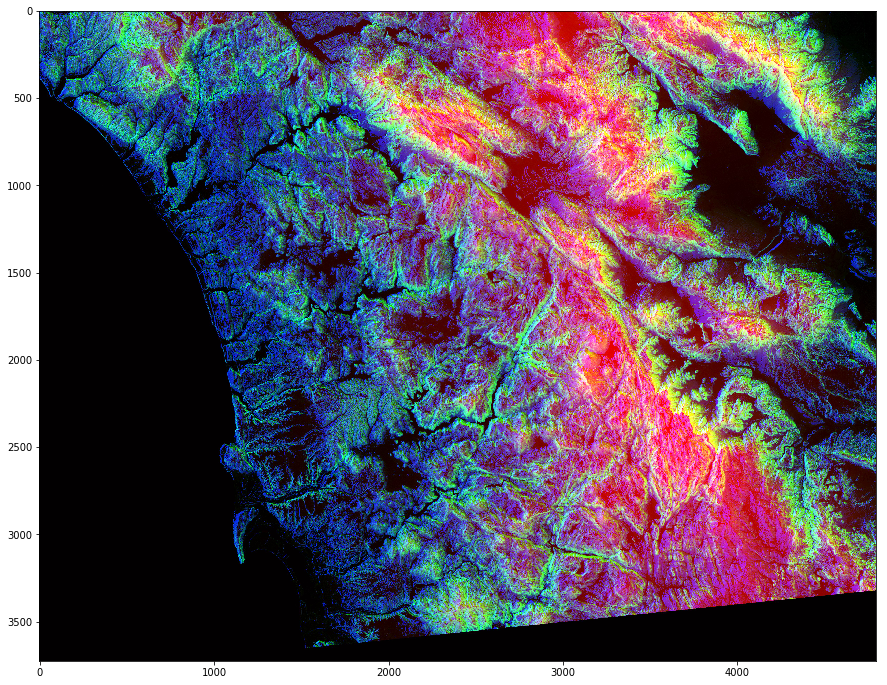

In [10]:
# We changed A SINGLE pixel
photo_data [150,250] = 0
plt.figure(figsize = (15,15))
plt.imshow(photo_data)

## Changing colors in a range

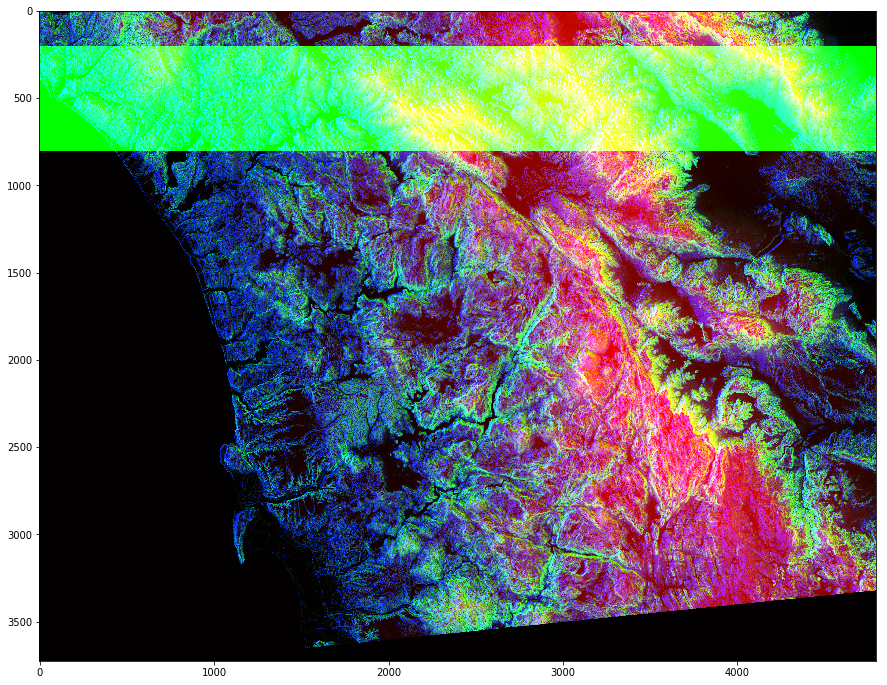

In [11]:
photo_data[200:800, :, 1] = 255
plt.figure(figsize = (15,15))
plt.imshow(photo_data)

Row 200 to 800, so it should show horizontally. (200:800)

Every value from row 200 to 800 in all the columns. (:)

And only the second, the green layer, rgb. (1)

/usr/lib/python3/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


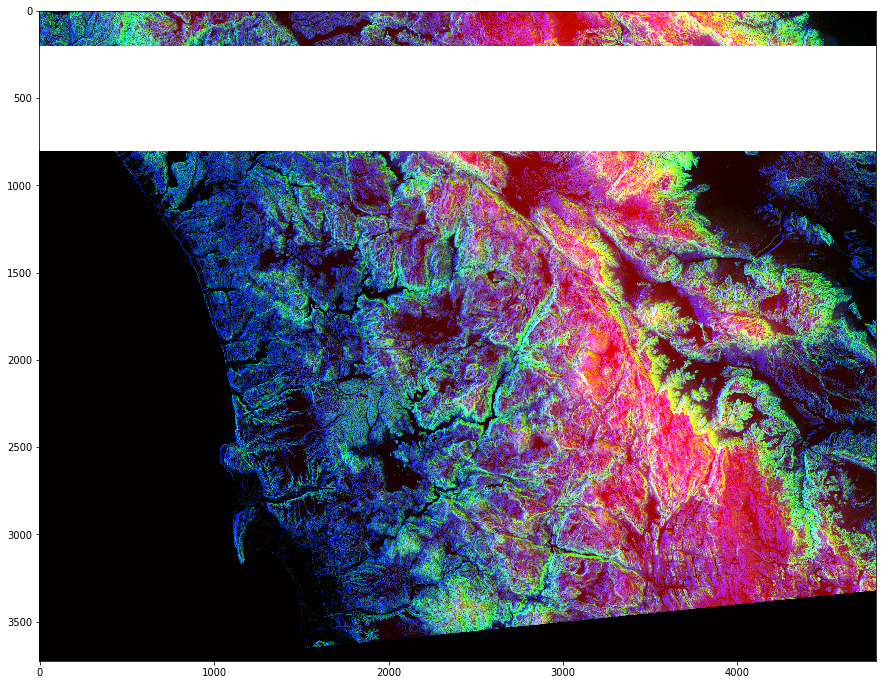

In [12]:
photo_data = misc.imread("./wifire/sd-3layers.jpg") # Set the default image
photo_data[200:800, :] = 255
plt.figure(figsize = (15,15))
plt.imshow(photo_data)

All the columns and all the layers on the range 200:800 at full intensity (255) -> White

## Pick all Pixels with Low Values

In [13]:
photo_data = misc.imread("./wifire/sd-3layers.jpg") # Set the default image
print("Shape of photo_data:",photo_data.shape)
low_value_filter = photo_data<200 
print("Shape of low_value_filter:", low_value_filter.shape)

/usr/lib/python3/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


## Filtering Out Low Values

Whenever the low_value_filter is True, set value to 0

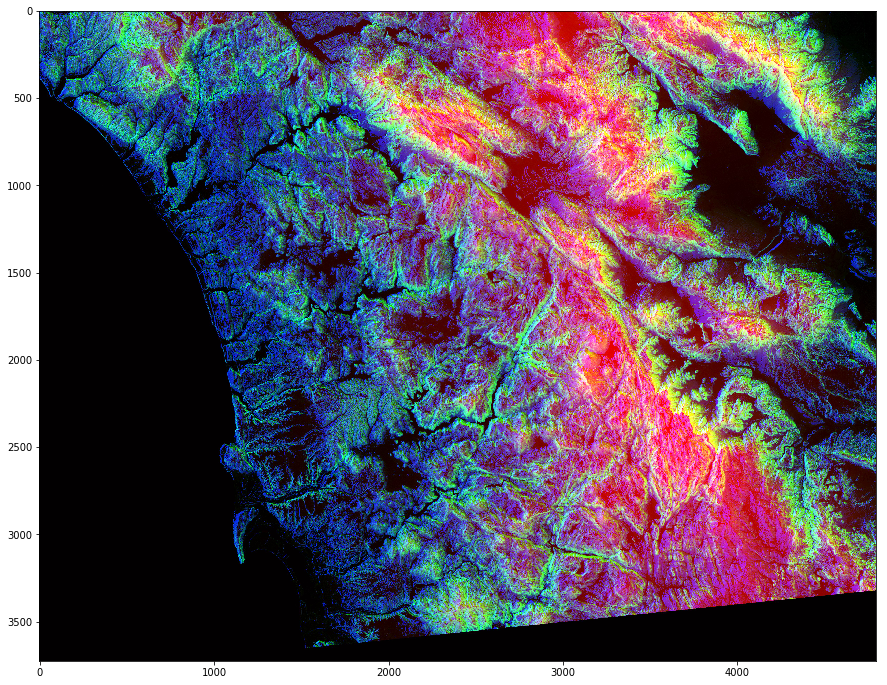

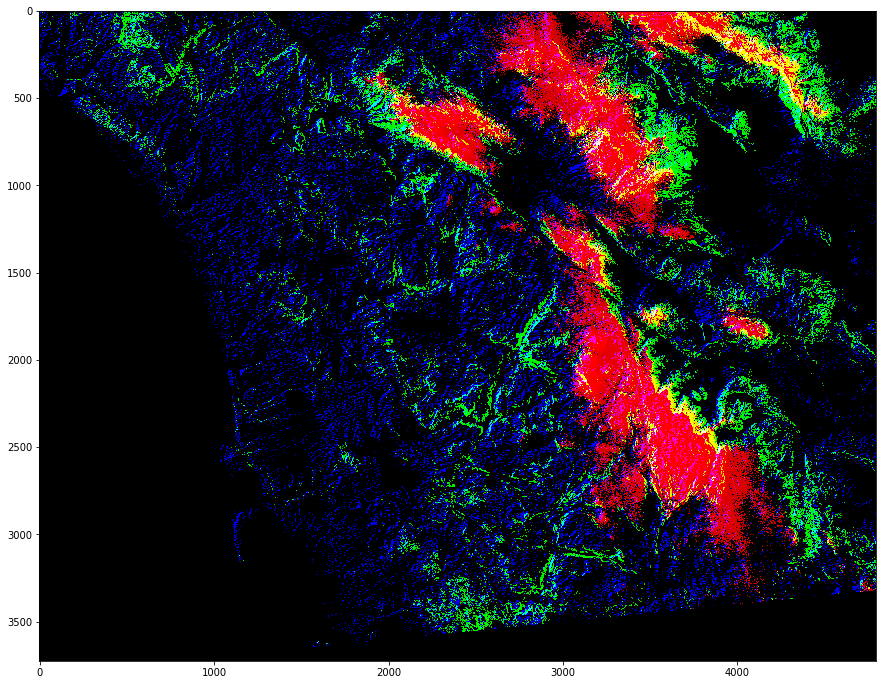

In [14]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## More Row and Column Operations

In [15]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [16]:
photo_data[rows_range, cols_range] = 255
# Full intensity to all pixels

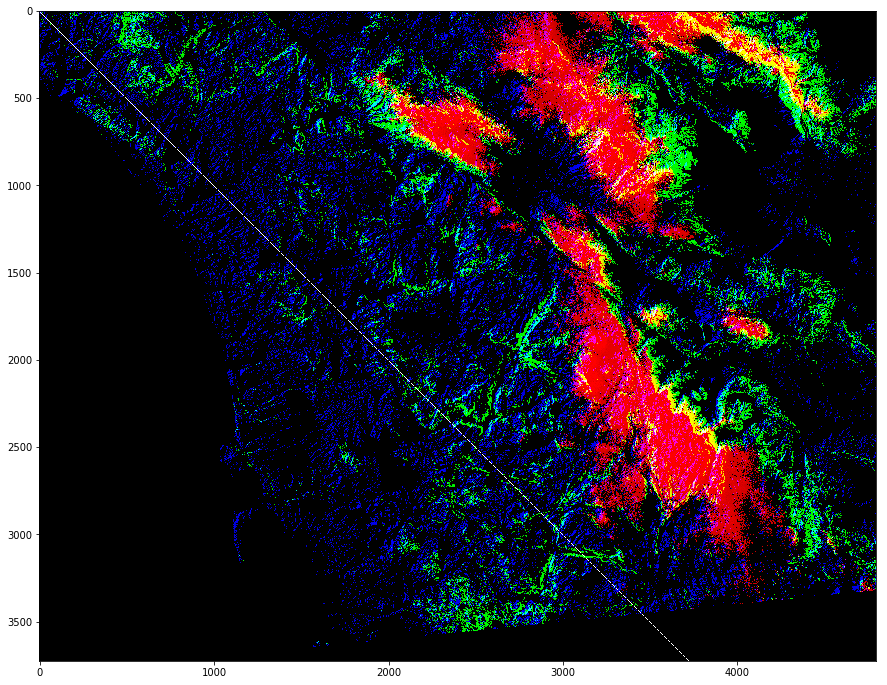

In [17]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Masking Images

In [19]:
total_rows, total_cols, total_layers = photo_data.shape
#print("photo_data = ", photo_data.shape)

X, Y = np.ogrid[:total_rows, :total_cols]
#print("X = ", X.shape, " and Y = " Y.shape)

/usr/lib/python3/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


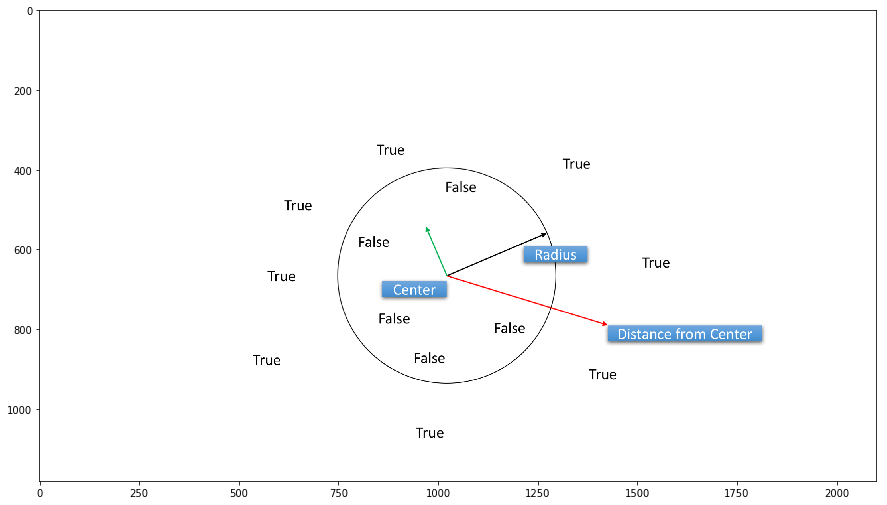

In [45]:
#The mask we want to use
photo_data = misc.imread("./wifire/circle.png")
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [24]:
#calculate the center
center_row, center_col = total_rows/2, total_cols/2
#print("center_row = ", center_row, " and center_col = ", center_col)
#print(X - center_row)
#print(Y - center_col)
dist_from_center = (X - center_row) **2 + (Y - center_col)**2
#print(dist_from_center)
radius = (total_rows/2)**2
#print(Radius = ", radius)
circular_mask = (dist_from_center > radius)
#print (circular_mask)
print (circular_mask[1500:1700, 2000:2200])

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


/usr/lib/python3/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


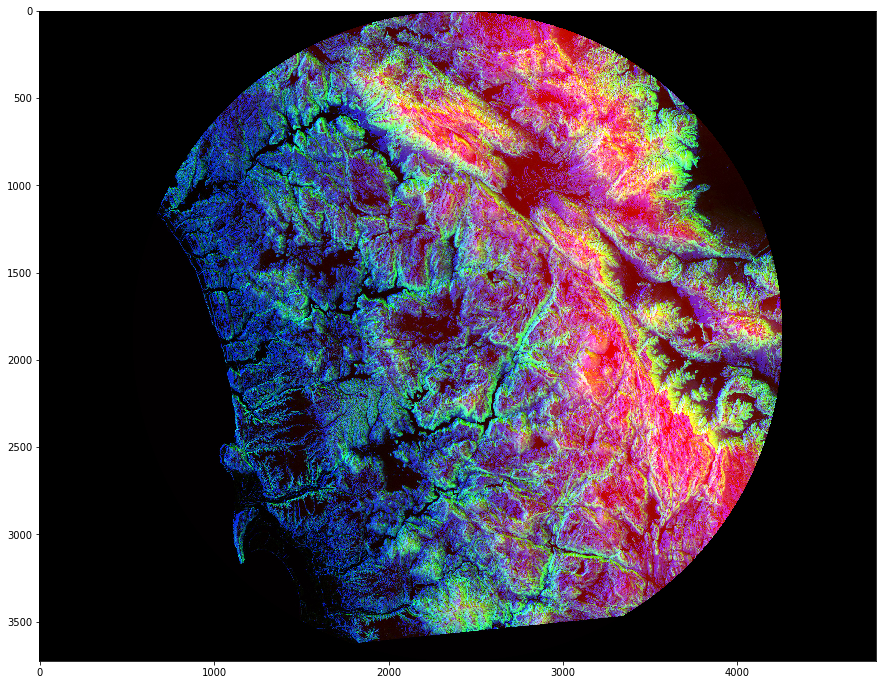

In [25]:
photo_data = misc.imread("./wifire/sd-3layers.jpg")
photo_data[circular_mask] = 0 # all the values go black
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Further Masking

In [26]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row #generates a mask for all rows adove
half_upper_mask = np.logical_and(half_upper, circular_mask)

/usr/lib/python3/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


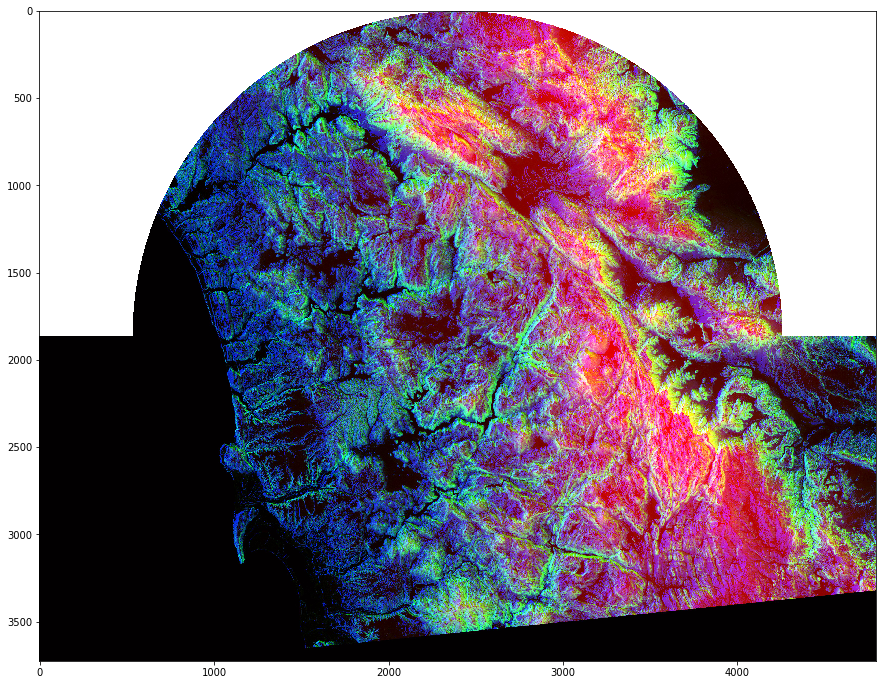

In [37]:
#import random 
photo_data = misc.imread("./wifire/sd-3layers.jpg")
photo_data[half_upper_mask] = 255 # 255 = white
#photo_data[half_upper_mask] = random.randint(100,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Further Processing of our Satellite Imagery

### Processing of RED Pixels

Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas.
We will do this by detecting high intensity RED Pixels and muting down other areas.

/usr/lib/python3/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


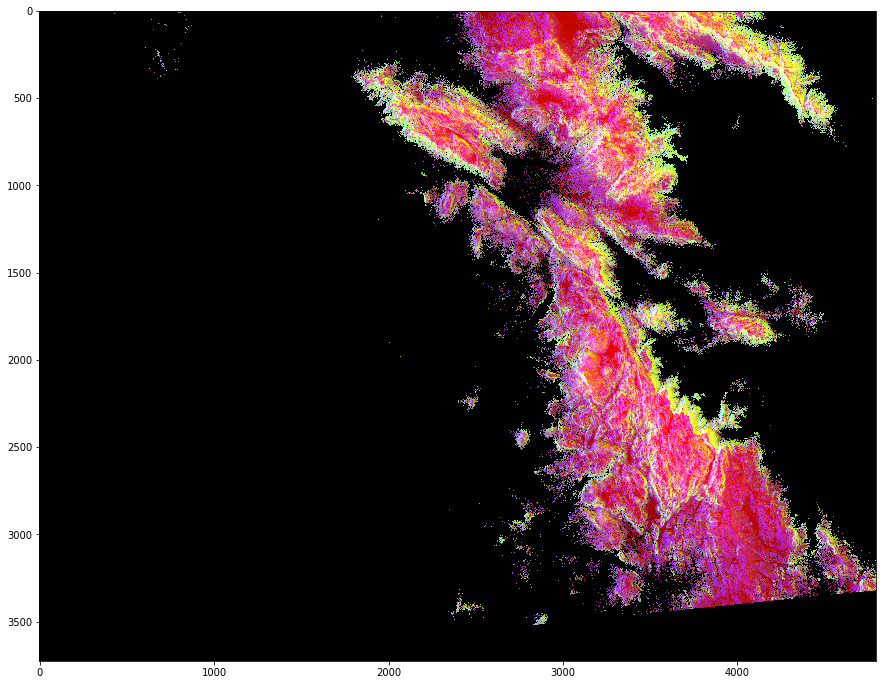

In [38]:
photo_data = misc.imread("./wifire/sd-3layers.jpg")
red_mask = photo_data[:,:,0] < 150 # 0 layer = RED layer
photo_data[red_mask] = 0 # 0 = Black
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

### Detecting Highly-GREEN Pixels

/usr/lib/python3/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


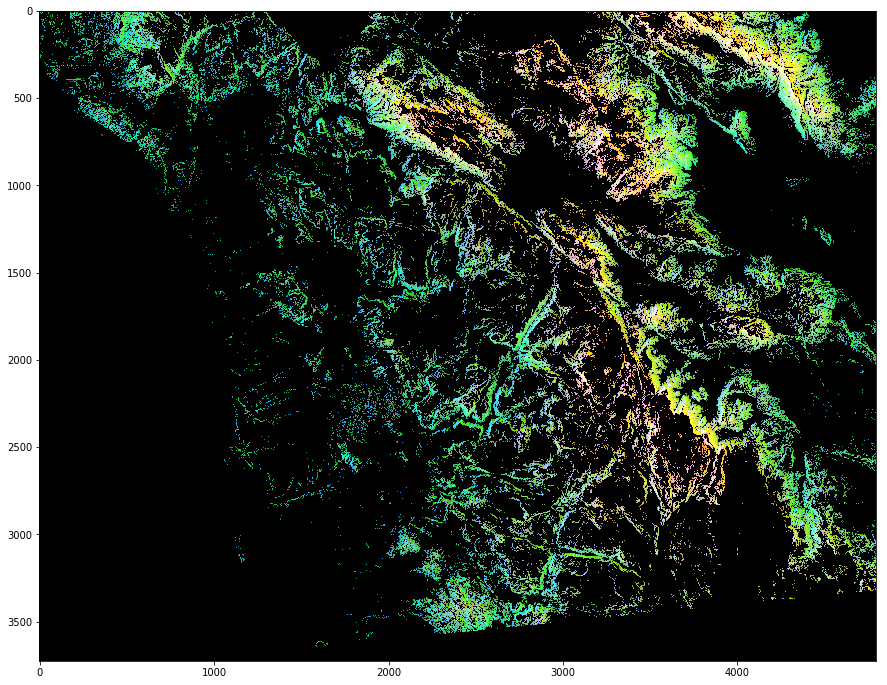

In [41]:
photo_data = misc.imread("./wifire/sd-3layers.jpg")
green_mask = photo_data[:,:,1] < 150 # 1 layer = GREEN layer
photo_data[green_mask] = 0 # 0 = Black
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

### Detecting Highly-BLUE Pixels

/usr/lib/python3/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


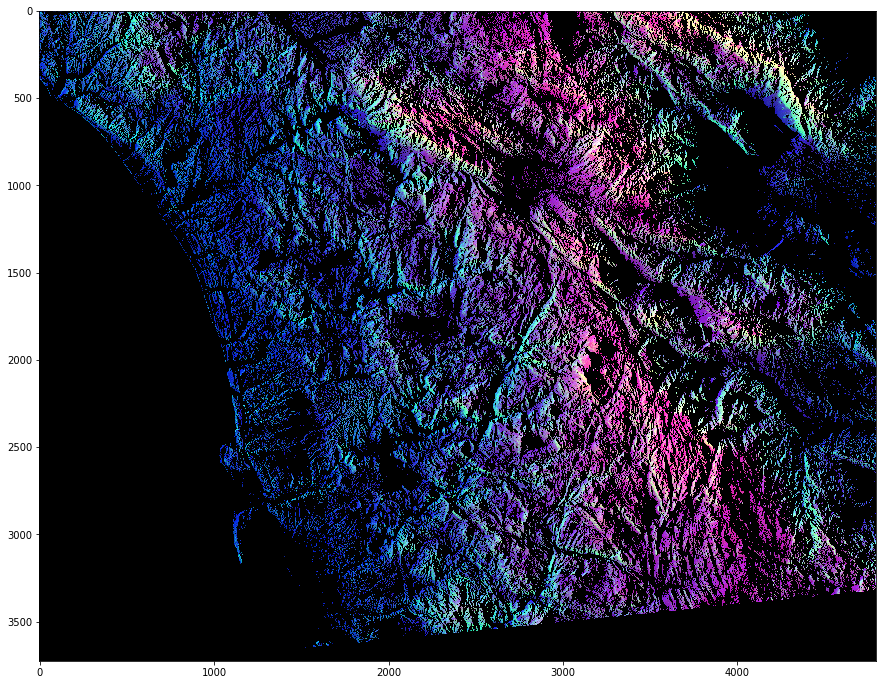

In [43]:
photo_data = misc.imread("./wifire/sd-3layers.jpg")
blue_mask = photo_data[:,:,2] < 150 # 2 layer = BLUE layer
photo_data[blue_mask] = 0 # 0 = Black
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE

/usr/lib/python3/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


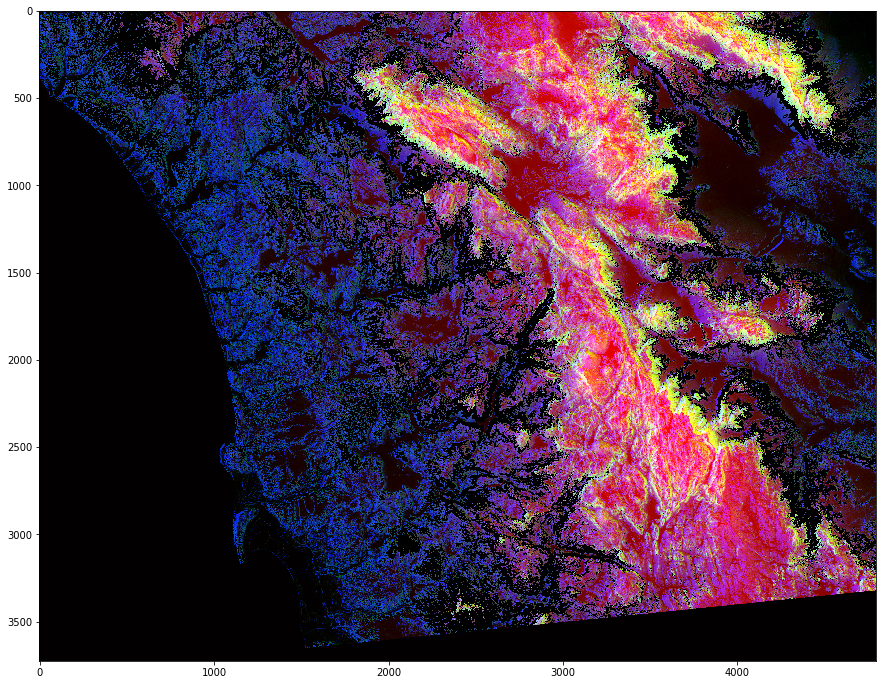

In [44]:
photo_data = misc.imread("./wifire/sd-3layers.jpg")
red_mask = photo_data[:,:,0] < 150
green_mask = photo_data[:,:,1] > 100
blue_mask = photo_data[:,:,2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0 # 0 = Black
plt.figure(figsize=(15,15))
plt.imshow(photo_data)